In [147]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import cross_validate, StratifiedKFold, GroupKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

import shap



In [5]:
SEED = 4565123
np.random.seed(SEED)

# Lidando com dados faltantes

Removi os dados cujo o paciente foi encaminhado para UTI e então fiz o preenchimento a partir do bfill e ffill. Encontrei um paciente cujo os dados de doenças estava completamente faltante, o removi.

In [6]:
dados = pd.read_excel('../dados/Kaggle_Sirio_Libanes_ICU_Prediction.xlsx')
dados.head()

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,...,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,WINDOW,ICU
0,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0-2,0
1,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,2-4,0
2,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4-6,0
3,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-1.000000,-1.000000,NaN,NaN,NaN,NaN,-1.000000,-1.000000,6-12,0
4,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-0.238095,-0.818182,-0.389967,0.407558,-0.230462,0.096774,-0.242282,-0.814433,ABOVE_12,1


In [7]:
dados_nao_podem_ser_usados_para_treino = dados[dados.ICU == 1]
dados_podem_ser_usados = dados[dados.ICU != 1]

In [8]:
def preenche_dados(dados):
    # continuas
    features_continuas_colunas = dados.iloc[:, 13:-2].columns
    features_continuas = dados.groupby('PATIENT_VISIT_IDENTIFIER')[features_continuas_colunas].fillna(method = 'bfill').fillna(method = 'ffill')
    # categoricas
    features_categoricas = dados.iloc[:, :13]
    # saida
    saida = dados.iloc[:, -2:]
    # dado final
    dados_final = pd.concat([features_categoricas, features_continuas, saida], ignore_index=True, axis =1)
    dados_final.columns = dados.columns
    return dados_final

In [9]:
dados_usaveis_preenchidos = preenche_dados(dados_podem_ser_usados)

In [10]:
dados_usaveis_preenchidos.describe()

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,...,RESPIRATORY_RATE_DIFF,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,ICU
count,1410.000000,1410.000000,1410.000000,1405.000000,1405.000000,1405.000000,1405.000000,1405.00000,1405.000000,1405.000000,...,1410.000000,1410.000000,1410.000000,1410.000000,1410.000000,1410.000000,1410.000000,1410.000000,1410.000000,1410.0
mean,195.193617,0.403546,0.387943,0.096797,0.019929,0.083986,0.014947,0.11032,0.047687,0.170819,...,-0.898874,-0.868170,-0.953227,-0.890379,-0.861390,-0.898845,-0.896732,-0.868889,-0.953360,0.0
std,111.378797,0.490783,0.487454,0.295787,0.139806,0.277465,0.121382,0.31340,0.213179,0.376484,...,0.182960,0.219884,0.134099,0.183792,0.235055,0.170486,0.182453,0.218622,0.133336,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0
25%,99.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0
50%,195.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0
75%,294.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,-0.823529,-0.833333,-0.939394,-0.838292,-0.829200,-0.841221,-0.826825,-0.831117,-0.939447,0.0
max,384.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,...,0.411765,0.023810,0.919192,0.217391,0.177852,-0.069094,0.401434,0.029497,0.917526,0.0


In [11]:
dados_usaveis_preenchidos[dados_usaveis_preenchidos.isnull().any(axis=1)]

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,...,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,WINDOW,ICU
995,199,0,10th,0,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.595238,-0.919192,-0.608696,-0.607383,-0.790037,-0.817204,-0.599662,-0.918403,0-2,0
996,199,0,10th,0,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.595238,-0.919192,-0.608696,-0.607383,-0.790037,-0.817204,-0.599662,-0.918403,2-4,0
997,199,0,10th,0,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.595238,-0.919192,-0.608696,-0.607383,-0.790037,-0.817204,-0.599662,-0.918403,4-6,0
998,199,0,10th,0,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.595238,-0.919192,-0.608696,-0.607383,-0.790037,-0.817204,-0.599662,-0.918403,6-12,0
999,199,0,10th,0,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.595238,-0.919192,-0.608696,-0.607383,-0.790037,-0.817204,-0.599662,-0.918403,ABOVE_12,0


In [12]:
dados_usaveis_preenchidos = dados_usaveis_preenchidos.dropna()

In [13]:
dados_nao_podem_ser_usados_para_treino.describe()

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,...,RESPIRATORY_RATE_DIFF,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,ICU
count,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,...,447.000000,452.000000,451.000000,462.000000,462.000000,455.000000,447.000000,452.000000,451.000000,515.0
mean,183.256311,0.642718,0.316505,0.139806,0.050485,0.135922,0.033010,0.176699,0.044660,0.328155,...,-0.394131,-0.631953,-0.785670,-0.628478,-0.496603,-0.699652,-0.439745,-0.633211,-0.784869,1.0
std,110.224992,0.479665,0.465565,0.347123,0.219157,0.343039,0.178836,0.381785,0.206758,0.469998,...,0.631401,0.390941,0.420921,0.423396,0.537778,0.346094,0.582378,0.389603,0.422510,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,1.0
25%,86.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,1.0
50%,179.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-0.647059,-0.785714,-0.939394,-0.779146,-0.692456,-0.874989,-0.697442,-0.782398,-0.939126,1.0
75%,276.500000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.117647,-0.333333,-0.797980,-0.410755,-0.141868,-0.477617,0.096774,-0.339714,-0.799206,1.0
max,382.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0


In [14]:
# Apenas os dados que não podem ser usados no treino apresentam dados faltantes, vou junta-los e preencher 

In [15]:
dados_completos = pd.concat([dados_nao_podem_ser_usados_para_treino, dados_usaveis_preenchidos])

In [16]:
dados_completo_preenchido = preenche_dados(dados_completos)

In [17]:
print(dados_completo_preenchido.isna().sum().to_string())

PATIENT_VISIT_IDENTIFIER            0
AGE_ABOVE65                         0
AGE_PERCENTIL                       0
GENDER                              0
DISEASE GROUPING 1                  0
DISEASE GROUPING 2                  0
DISEASE GROUPING 3                  0
DISEASE GROUPING 4                  0
DISEASE GROUPING 5                  0
DISEASE GROUPING 6                  0
HTN                                 0
IMMUNOCOMPROMISED                   0
OTHER                               0
ALBUMIN_MEDIAN                      0
ALBUMIN_MEAN                        0
ALBUMIN_MIN                         0
ALBUMIN_MAX                         0
ALBUMIN_DIFF                        0
BE_ARTERIAL_MEDIAN                  0
BE_ARTERIAL_MEAN                    0
BE_ARTERIAL_MIN                     0
BE_ARTERIAL_MAX                     0
BE_ARTERIAL_DIFF                    0
BE_VENOUS_MEDIAN                    0
BE_VENOUS_MEAN                      0
BE_VENOUS_MIN                       0
BE_VENOUS_MA

In [18]:
dados_completos['treinavel'] = dados_completos.ICU

<AxesSubplot:>

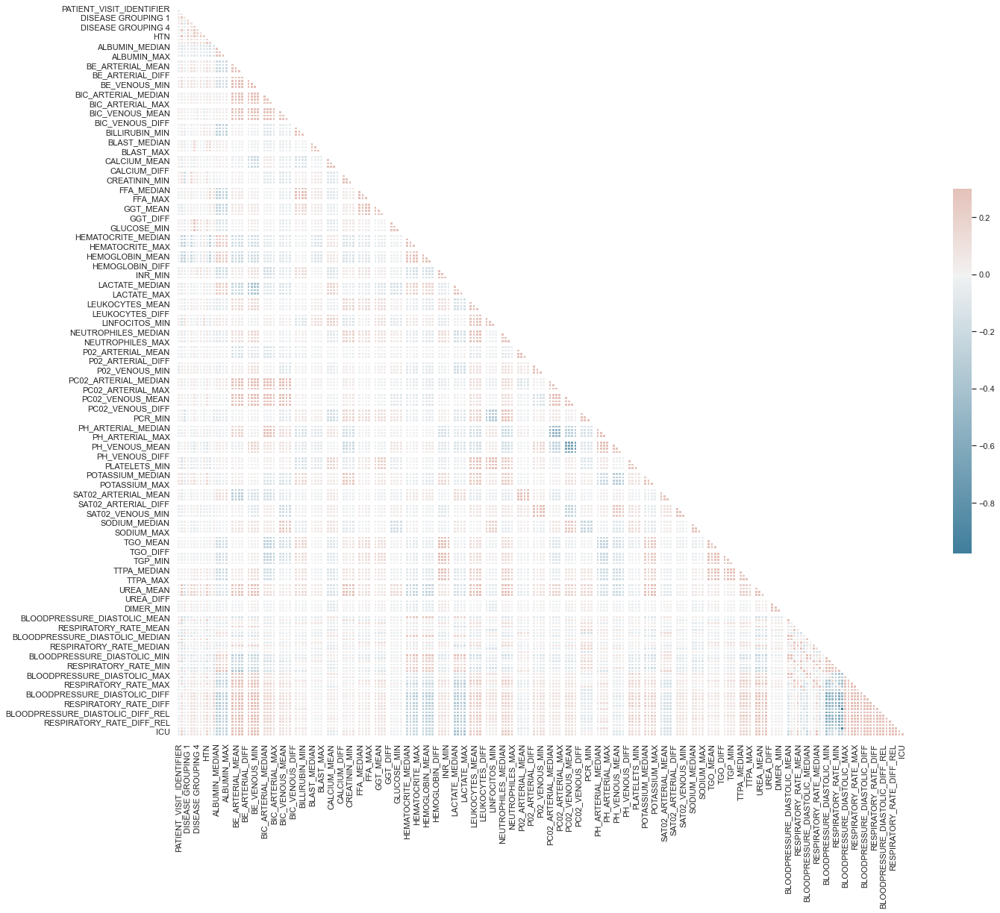

In [19]:
sns.set_theme(style="white")

# Compute the correlation matrix
corr = dados_completos.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(22, 18))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

Muito dado, não da pra entender. Vou utilizar todas as features para treinamento

# Extração dos dados par atreinamento e teste

In [20]:
def extracao_dado_inicial(rows):
    if (np.any(rows['ICU'])):
        rows['ICU'] = 1
    return rows[rows["treinavel"] != 1]

In [114]:
dados_para_treinamento = dados_completos.groupby('PATIENT_VISIT_IDENTIFIER').apply(extracao_dado_inicial)

In [115]:
dados_para_treinamento = dados_para_treinamento.reset_index(drop=True)

In [190]:
# Verificando distribuição de dados
dados_para_treinamento.value_counts('PATIENT_VISIT_IDENTIFIER')

PATIENT_VISIT_IDENTIFIER
384    5
143    5
146    5
147    5
298    5
      ..
82     1
325    1
87     1
103    1
235    1
Length: 352, dtype: int64

In [117]:
dados_para_treinamento.describe()

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,...,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,ICU,treinavel
count,1405.000000,1405.000000,1405.000000,1405.000000,1405.000000,1405.000000,1405.000000,1405.00000,1405.000000,1405.000000,...,1405.000000,1405.000000,1405.000000,1405.000000,1405.000000,1405.000000,1405.000000,1405.000000,1405.000000,1405.0
mean,195.180071,0.404982,0.389324,0.096797,0.019929,0.083986,0.014947,0.11032,0.047687,0.170819,...,-0.869141,-0.953348,-0.891381,-0.862294,-0.899233,-0.897015,-0.869847,-0.953485,0.327402,0.0
std,111.576713,0.491063,0.487771,0.295787,0.139806,0.277465,0.121382,0.31340,0.213179,0.376484,...,0.219670,0.134322,0.183347,0.234983,0.170665,0.182715,0.218419,0.133556,0.469432,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000,0.0
25%,99.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000,0.0
50%,194.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000,0.0
75%,294.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,-0.833333,-0.939394,-0.850932,-0.842953,-0.843736,-0.831266,-0.833333,-0.939447,1.000000,0.0
max,384.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,...,0.023810,0.919192,0.217391,0.177852,-0.069094,0.401434,0.029497,0.917526,1.000000,0.0


In [191]:
# Visualizando a dispersão dos labels

dados_para_treinamento.ICU.value_counts()

0    945
1    460
Name: ICU, dtype: int64

In [119]:
# Transformação da feature escala de idade

renomear = {'10th' : 1, 
    '20th' : 2, 
    '30th' : 3, 
    '40th' : 4, 
    '50th' : 5, 
    '60th' : 6, 
    '70th' : 7, 
    '80th' : 8,
    '90th' : 9, 
    'Above 90th' : 10
}

dados_para_treinamento.AGE_PERCENTIL = dados_para_treinamento.AGE_PERCENTIL.map(renomear)

## Separação dados, features e labels

In [121]:
x = dados_para_treinamento.iloc[:, :-3].drop('PATIENT_VISIT_IDENTIFIER', axis =1)
y = dados_para_treinamento['ICU']


In [122]:
print(x.shape)
print(y.shape)

(1405, 228)
(1405,)


# Criação do modelo

## Modelo sem transformação


In [145]:
np.random.seed(SEED)

cv = GroupKFold(10)
modelo = RandomForestClassifier()

score = cross_validate(modelo, x, y, cv = 10, groups = dados_para_treinamento.PATIENT_VISIT_IDENTIFIER)
score_medio = score['test_score'].mean()
score_std = score['test_score'].std()
print(f'Modelo RandomForest sem transformação: acuracia {score_medio :0.2f} +/-{score_std :0.2f} ')

Modelo RandomForest sem transformação: acuracia 0.78 +/-0.03 


## Modelo com transformação

In [146]:
np.random.seed(SEED)


scaler = StandardScaler()
cv = GroupKFold(10)

modelo = RandomForestClassifier()

pipeline = Pipeline([('transformacao',scaler), ('estimador',modelo)])

score = cross_validate(pipeline, x, y, cv = 10, groups = dados_para_treinamento.PATIENT_VISIT_IDENTIFIER)
score_medio = score['test_score'].mean()
score_std = score['test_score'].std()
print(f'Modelo RandomForest com transformação: acuracia {score_medio :0.2f} +/-{score_std :0.2f} ')


Modelo RandomForest com transformação: acuracia 0.78 +/-0.03 


Normalizaçao dos dados aparente ser irrelevante nesse caso, os dados ja aparentam estar normalizados

In [187]:
modelo.fit(x, y)
explainer = shap.TreeExplainer(modelo)
shap_values = explainer.shap_values(x)

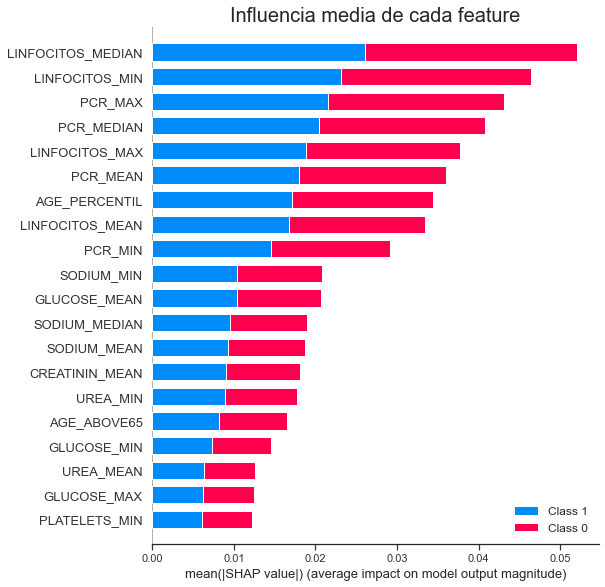

In [182]:
plt.title('Influencia media de cada feature', fontsize = 20)
shap.summary_plot(shap_values, x)

# Tunning dos hiper-parametros